# Torch audio
- torchaudio는 여러 쓸모있는 음성관련 함수들이 많다고함
  - tensor에 넣는게 중요하니 그 과정을 좀 살펴보자

In [1]:
import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

print(torch.__version__)
print(torchaudio.__version__)

1.9.0a0+c3d40fd
0.7.0a0+42d447d


################################################################################
### WARNING, path does not exist: KALDI_ROOT=/mnt/matylda5/iveselyk/Tools/kaldi-trunk
###          (please add 'export KALDI_ROOT=<your_path>' in your $HOME/.profile)
###          (or run as: KALDI_ROOT=<your_path> python <your_script>.py)
################################################################################

/opt/conda/lib/python3.8/site-packages/torchaudio-0.7.0a0+42d447d-py3.8-linux-x86_64.egg/torchaudio/backend/utils.py:53: UserWarning: "sox" backend is being deprecated. The default backend will be changed to "sox_io" backend in 0.8.0 and "sox" backend will be removed in 0.9.0. Please migrate to "sox_io" backend. Please refer to https://github.com/pytorch/audio/issues/903 for the detail.
  warnings.warn(


In [2]:
import io
import os
import math
import tarfile
import multiprocessing

import scipy
import librosa
import boto3 # 파이썬에서 아마존의 aws 클라우드 인프라를 사용하기 위한 모듈
from botocore import UNSIGNED
from botocore.config import Config
import requests
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import time
from IPython.display import Audio, display

In [3]:
[width, height] = matplotlib.rcParams['figure.figsize']

if width < 10:
    matplotlib.rcParams['figure.figsize'] = [width * 2.5, height]
    
_SAMPLE_DIR = "/raid/jskim/data/audio_data/_sample_data"

SAMPLE_WAV_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/steam-train-whistle-daniel_simon.wav"
SAMPLE_WAV_PATH = os.path.join(_SAMPLE_DIR, "steam.wav")

SAMPLE_WAV_SPEECH_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"
SAMPLE_WAV_SPEECH_PATH = os.path.join(_SAMPLE_DIR, "speech.wav")

SAMPLE_RIR_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/distant-16k/room-response/rm1/impulse/Lab41-SRI-VOiCES-rm1-impulse-mc01-stu-clo.wav"
SAMPLE_RIR_PATH = os.path.join(_SAMPLE_DIR, "rir.wav")


SAMPLE_NOISE_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/distant-16k/distractors/rm1/babb/Lab41-SRI-VOiCES-rm1-babb-mc01-stu-clo.wav"
SAMPLE_NOISE_PATH = os.path.join(_SAMPLE_DIR, "bg.wav")

SAMPLE_MP3_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/steam-train-whistle-daniel_simon.mp3"
SAMPLE_MP3_PATH = os.path.join(_SAMPLE_DIR, "steam.mp3")

SAMPLE_GSM_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/steam-train-whistle-daniel_simon.gsm"
SAMPLE_GSM_PATH = os.path.join(_SAMPLE_DIR, "steam.gsm")

SAMPLE_TAR_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit.tar.gz"
SAMPLE_TAR_PATH = os.path.join(_SAMPLE_DIR, "sample.tar.gz")
SAMPLE_TAR_ITEM = "VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"

S3_BUCKET = "pytorch-tutorial-assets"
S3_KEY = "VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"

YESNO_DATASET_PATH = os.path.join(_SAMPLE_DIR, "yes_no")
os.makedirs(YESNO_DATASET_PATH, exist_ok=True)
os.makedirs(_SAMPLE_DIR, exist_ok=True)

In [4]:
def _fetch_data():
    uri = [
        (SAMPLE_WAV_URL, SAMPLE_WAV_PATH),
        (SAMPLE_WAV_SPEECH_URL, SAMPLE_WAV_SPEECH_PATH),
        (SAMPLE_RIR_URL, SAMPLE_RIR_PATH),
        (SAMPLE_NOISE_URL, SAMPLE_NOISE_PATH),
        (SAMPLE_MP3_URL, SAMPLE_MP3_PATH),
        (SAMPLE_GSM_URL, SAMPLE_GSM_PATH),
        (SAMPLE_TAR_URL, SAMPLE_TAR_PATH),
    ]
    for url, path in uri:
        with open(path, 'wb') as file_:
            file_.write(requests.get(url).content)

_fetch_data()

## Multi processing
- threading모듈과 비슷한 멀티프로세스 패키지다.

In [5]:
def _download_yesno():
    if os.path.exists(os.path.join(YESNO_DATASET_PATH, "waves_yesno.tar.gz")):
        return
    torchaudio.datasets.YESNO(root=YESNO_DATASET_PATH, download=True)

YESNO_DOWNLOAD_PROCESS = multiprocessing.Process(target=_download_yesno)
YESNO_DOWNLOAD_PROCESS.start()

In [6]:
def _get_sample(path, resample=None):
    effects = [
        ["remix", "1"]
    ]
    if resample:
        effects.extend([
            ["lowpass", f"{resample // 2}"],
            ["rate", f'{resample}'],
        ])
    return torchaudio.sox_effects.apply_effects_file(path, effects=effects)

def get_speech_sample(*, resample=None):
    return _get_sample(SAMPLE_WAV_SPEECH_PATH, resample=resample)

def get_sample(*, resample=None):
    return _get_sample(SAMPLE_WAV_PATH, resample=resample)

def get_rir_sample(*, resample=None, processed=False):
    rir_raw, sample_rate = _get_sample(SAMPLE_RIR_PATH, resample=resample)
    if not processed:
        return rir_raw, sample_rate
    rir = rir_raw[:, int(sample_rate*1.01):int(sample_rate*1.3)]
    rir = rir / torch.norm(rir, p=2)
    rir = torch.flip(rir, [1]) # 1 번 dim에서의 순서를 역배열로 바꿈
    return rir, sample_rate

def get_noise_sample(*, resample=None):
    return _get_sample(SAMPLE_NOISE_PATH, resample=resample)

In [80]:
def print_stats(waveform, sample_rate=None, src=None):
    if src:
        print("-" * 10)
        print("Source:", src)
        print("-" * 10)
    if sample_rate:
        print("Sample Rate:", sample_rate)
    print("Shape:", tuple(waveform.shape))
    print("Dtype:", waveform.dtype)
    print(f" - Max:     {waveform.max().item():6.3f}")
    print(f" - Min:     {waveform.min().item():6.3f}")
    print(f" - Mean:    {waveform.mean().item():6.3f}")
    print(f" - Std Dev: {waveform.std().item():6.3f}")
    print()
    print(waveform)
    print()
    
def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].plot(time_axis, waveform[c], linewidth=1)
        axes[c].grid(True)
        if num_channels > 1:
            axes[c].set_ylabel(f'Channel {c+1}')
        if xlim:
            axes[c].set_xlim(xlim)
        if ylim:
            axes[c].set_ylim(ylim)
    figure.suptitle(title)
    plt.show(block=False)
    
    
def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate

    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].specgram(waveform[c], Fs=sample_rate)
        if num_channels > 1:
            axes[c].set_ylabel(f'Channel {c+1}')
        if xlim:
            axes[c].set_xlim(xlim)
    figure.suptitle(title)
    plt.show(block=False)
    
def play_audio(waveform, sample_rate):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    if num_channels == 1:
        display(Audio(waveform[0], rate=sample_rate))
    elif num_channels == 2:
        display(Audio((waveform[0], waveform[1]), rate=sample_rate))
    else:
        raise ValueError("Waveform with more than 2 channels are not supported.")
        
def inspect_file(path):
    print("-" * 10)
    print("Source:", path)
    print("-" * 10)
    print(f" - File size: {os.path.getsize(path)} bytes")
    print(f" - {torchaudio.info(path)}")
    
def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None):  
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or 'Spectrogram (db)')
    axs.set_ylabel(ylabel)
    axs.set_xlabel('frame')
    im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
    if xmax:
        axs.set_xlim((0, xmax))
    fig.colorbar(im, ax=axs)
    plt.show(block=False)
    
def plot_mel_fbank(fbank, title=None):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or 'Filter bank')
    axs.imshow(fbank, aspect='auto')
    axs.set_ylabel('frequency bin')
    axs.set_xlabel('mel bin')
    plt.show(block=False)    
    
def get_spectrogram(
    n_fft = 400,
    win_len = None,
    hop_len = None,
    power = 2.0,
):
    waveform, _ = get_speech_sample()
    spectrogram = T.Spectrogram(
        n_fft=n_fft,
        win_length=win_len,
        hop_length=hop_len,
#         center=True,
#         pad_mode="reflect",
        power=power,
    )
    return spectrogram(waveform)

def plot_pitch(waveform, sample_rate, pitch):
    figure, axis = plt.subplots(1, 1)
    axis.set_title("Pitch Feature")
    axis.grid(True)

    end_time = waveform.shape[1] / sample_rate
    time_axis = torch.linspace(0, end_time,  waveform.shape[1])
    axis.plot(time_axis, waveform[0], linewidth=1, color='gray', alpha=0.3)

    axis2 = axis.twinx()
    time_axis = torch.linspace(0, end_time, pitch.shape[1])
    ln2 = axis2.plot(
        time_axis, pitch[0], linewidth=2, label='Pitch', color='green')

    axis2.legend(loc=0)
    plt.show(block=False)
    
def plot_kaldi_pitch(waveform, sample_rate, pitch, nfcc):
    figure, axis = plt.subplots(1, 1)
    axis.set_title("Kaldi Pitch Feature")
    axis.grid(True)

    end_time = waveform.shape[1] / sample_rate
    time_axis = torch.linspace(0, end_time,  waveform.shape[1])
    axis.plot(time_axis, waveform[0], linewidth=1, color='gray', alpha=0.3)

    time_axis = torch.linspace(0, end_time, pitch.shape[1])
    ln1 = axis.plot(time_axis, pitch[0], linewidth=2, label='Pitch', color='green')
    axis.set_ylim((-1.3, 1.3))

    axis2 = axis.twinx()
    time_axis = torch.linspace(0, end_time, nfcc.shape[1])
    ln2 = axis2.plot(
        time_axis, nfcc[0], linewidth=2, label='NFCC', color='blue', linestyle='--')

    lns = ln1 + ln2
    labels = [l.get_label() for l in lns]
    axis.legend(lns, labels, loc=0)
    plt.show(block=False)
    


In [8]:
DEFAULT_OFFSET = 201
SWEEP_MAX_SAMPLE_RATE = 48000
DEFAULT_LOWPASS_FILTER_WIDTH = 6
DEFAULT_ROLLOFF = 0.99
DEFAULT_RESAMPLING_METHOD = 'sinc_interpolation'


def _get_log_freq(sample_rate, max_sweep_rate, offset):
    """Get freqs evenly spaced out in log-scale, between [0, max_sweep_rate // 2]

    offset is used to avoid negative infinity `log(offset + x)`.

    """
    half = sample_rate // 2
    start, stop = math.log(offset), math.log(offset + max_sweep_rate // 2)
    return torch.exp(torch.linspace(start, stop, sample_rate, dtype=torch.double)) - offset

def _get_inverse_log_freq(freq, sample_rate, offset):
    """Find the time where the given frequency is given by _get_log_freq"""
    half = sample_rate // 2
    return sample_rate * (math.log(1 + freq / offset) / math.log(1 + half / offset))

def _get_freq_ticks(sample_rate, offset, f_max):
  # Given the original sample rate used for generating the sweep,
  # find the x-axis value where the log-scale major frequency values fall in
    time, freq = [], []
    for exp in range(2, 5):
        for v in range(1, 10):
            f = v * 10 ** exp
            if f < sample_rate // 2:
                t = _get_inverse_log_freq(f, sample_rate, offset) / sample_rate
                time.append(t)
                freq.append(f)
    t_max = _get_inverse_log_freq(f_max, sample_rate, offset) / sample_rate
    time.append(t_max)
    freq.append(f_max)
    return time, freq

def plot_sweep(waveform, sample_rate, title, max_sweep_rate=SWEEP_MAX_SAMPLE_RATE, offset=DEFAULT_OFFSET):
    x_ticks = [100, 500, 1000, 5000, 10000, 20000, max_sweep_rate // 2]
    y_ticks = [1000, 5000, 10000, 20000, sample_rate//2]

    time, freq = _get_freq_ticks(max_sweep_rate, offset, sample_rate // 2)
    freq_x = [f if f in x_ticks and f <= max_sweep_rate // 2 else None for f in freq]
    freq_y = [f for f in freq if f >= 1000 and f in y_ticks and f <= sample_rate // 2]

    figure, axis = plt.subplots(1, 1)
    axis.specgram(waveform[0].numpy(), Fs=sample_rate)
    plt.xticks(time, freq_x)
    plt.yticks(freq_y, freq_y)
    axis.set_xlabel('Original Signal Frequency (Hz, log scale)')
    axis.set_ylabel('Waveform Frequency (Hz)')
    axis.xaxis.grid(True, alpha=0.67)
    axis.yaxis.grid(True, alpha=0.67)
    figure.suptitle(f'{title} (sample rate: {sample_rate} Hz)')
    plt.show(block=True)
    
def get_sine_sweep(sample_rate, offset=DEFAULT_OFFSET):
    max_sweep_rate = sample_rate
    freq = _get_log_freq(sample_rate, max_sweep_rate, offset)
    delta = 2 * math.pi * freq / sample_rate
    cummulative = torch.cumsum(delta, dim=0)
    signal = torch.sin(cummulative).unsqueeze(dim=0)
    return signal

def benchmark_resample(
    method,
    waveform,
    sample_rate,
    resample_rate,
    lowpass_filter_width=DEFAULT_LOWPASS_FILTER_WIDTH,
    rolloff=DEFAULT_ROLLOFF,
    resampling_method=DEFAULT_RESAMPLING_METHOD,
    beta=None,
    librosa_type=None,
    iters=5
):
    if method == "functional":
        begin = time.time()
        for _ in range(iters):
            F.resample(waveform, sample_rate, resample_rate, lowpass_filter_width=lowpass_filter_width,
                 rolloff=rolloff, resampling_method=resampling_method)
        elapsed = time.time() - begin
        return elapsed / iters
    elif method == "transforms":
        resampler = T.Resample(sample_rate, resample_rate, lowpass_filter_width=lowpass_filter_width,
                           rolloff=rolloff, resampling_method=resampling_method, dtype=waveform.dtype)
        begin = time.time()
        for _ in range(iters):
            resampler(waveform)
        elapsed = time.time() - begin
        return elapsed / iters
    elif method == "librosa":
        waveform_np = waveform.squeeze().numpy()
        begin = time.time()
        for _ in range(iters):
            librosa.resample(waveform_np, sample_rate, resample_rate, res_type=librosa_type)
        elapsed = time.time() - begin
        return elapsed / iters

In [9]:
metadata = torchaudio.info(SAMPLE_WAV_PATH)
print(metadata)

(sox_signalinfo_t {
  rate-> 44100
  channels-> 2
  precision-> 16
  length-> 218736
  mult-> 0
}
, sox_encodinginfo_t {
  encoding-> 1
  bits_per_sample-> 16
  compression-> inf
  reverse_bytes-> 0
  reverse_nibbles-> 0
  reverse_bits-> 0
  opposite_endian-> 0
}
)


In [10]:
metadata = torchaudio.info(SAMPLE_MP3_PATH)
print(metadata)

metadata = torchaudio.info(SAMPLE_GSM_PATH)
print(metadata)

(sox_signalinfo_t {
  rate-> 44100
  channels-> 2
  precision-> 16
  length-> 221118
  mult-> 0
}
, sox_encodinginfo_t {
  encoding-> 22
  bits_per_sample-> 0
  compression-> inf
  reverse_bytes-> 0
  reverse_nibbles-> 0
  reverse_bits-> 0
  opposite_endian-> 0
}
)
(sox_signalinfo_t {
  rate-> 8000
  channels-> 1
  precision-> 16
  length-> 0
  mult-> 0
}
, sox_encodinginfo_t {
  encoding-> 21
  bits_per_sample-> 0
  compression-> inf
  reverse_bytes-> 0
  reverse_nibbles-> 0
  reverse_bits-> 0
  opposite_endian-> 0
}
)


In [15]:
# src에서 info 읽어오는건 구버젼 torch audio에서는 지원이 안됨

# print("Source:", SAMPLE_MP3_URL)
# with requests.get(SAMPLE_MP3_URL, stream=True) as response:
#     metadata = torchaudio.info(response.raw, format="mp3")

#     print(f"Fetched {response.raw.tell()} bytes.")
# print(metadata)

Sample Rate: 16000
Shape: (1, 54400)
Dtype: torch.float32
 - Max:      0.668
 - Min:     -1.000
 - Mean:     0.000
 - Std Dev:  0.122

tensor([[0.0183, 0.0180, 0.0180,  ..., 0.0018, 0.0019, 0.0032]])



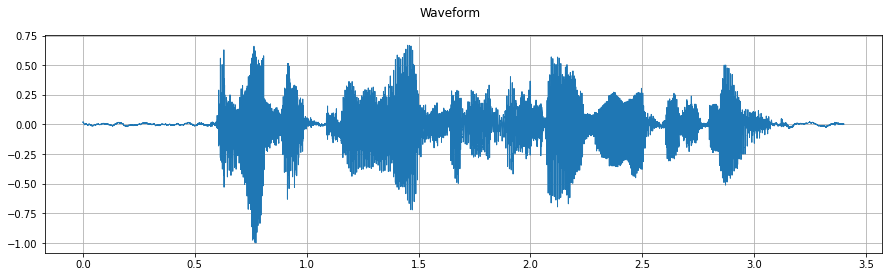

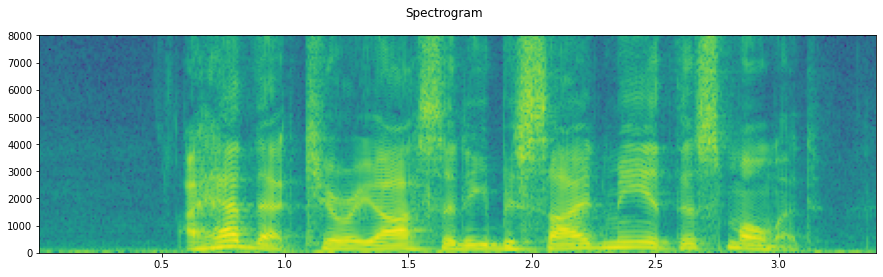

In [16]:
waveform, sample_rate = torchaudio.load(SAMPLE_WAV_SPEECH_PATH)

print_stats(waveform, sample_rate=sample_rate)
plot_waveform(waveform, sample_rate)
plot_specgram(waveform, sample_rate)
play_audio(waveform, sample_rate)

In [21]:
waveform, sample_rate = get_sample()
print_stats(waveform, sample_rate=sample_rate)

# Save without any encoding option.
# The function will pick up the encoding which
# the provided data fit
path = "save_example_default.wav"
path_temp = os.path.join(_SAMPLE_DIR, path)
torchaudio.save(path_temp, waveform, sample_rate)
inspect_file(path_temp)

# Save as 16-bit signed integer Linear PCM
# The resulting file occupies half the storage but loses precision
path = "save_example_PCM_S16.wav"
path_temp = os.path.join(_SAMPLE_DIR, path)
torchaudio.save(
    path_temp, waveform, sample_rate,
    encoding="PCM_S", bits_per_sample=16)
inspect_file(path_temp)

Sample Rate: 44100
Shape: (1, 109368)
Dtype: torch.float32
 - Max:      0.508
 - Min:     -0.449
 - Mean:    -0.000
 - Std Dev:  0.122

tensor([[0.0027, 0.0063, 0.0092,  ..., 0.0032, 0.0047, 0.0052]])

----------
Source: /raid/jskim/data/audio_data/_sample_data/save_example_default.wav
----------
 - File size: 218780 bytes
 - (sox_signalinfo_t {
  rate-> 44100
  channels-> 1
  precision-> 16
  length-> 109368
  mult-> 0
}
, sox_encodinginfo_t {
  encoding-> 1
  bits_per_sample-> 16
  compression-> inf
  reverse_bytes-> 0
  reverse_nibbles-> 0
  reverse_bits-> 0
  opposite_endian-> 0
}
)


TypeError: save() got an unexpected keyword argument 'encoding'

In [22]:
waveform, sample_rate = get_sample(resample=8000)

formats = [
  "mp3",
  "flac",
  "vorbis",
  "sph",
  "amb",
  "amr-nb",
  "gsm",
]


for format in formats:
    path = f"save_example.{format}"
    path_temp = os.path.join(_SAMPLE_DIR, 'FormatSamples', path)
    torchaudio.save(path_temp, waveform, sample_rate, format=format)
    inspect_file(path)

TypeError: save() got an unexpected keyword argument 'format'

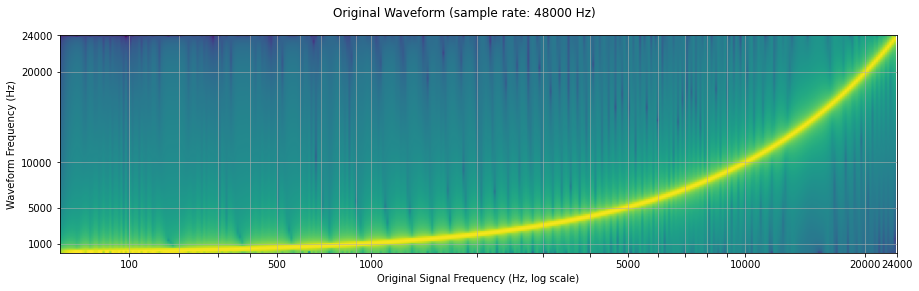

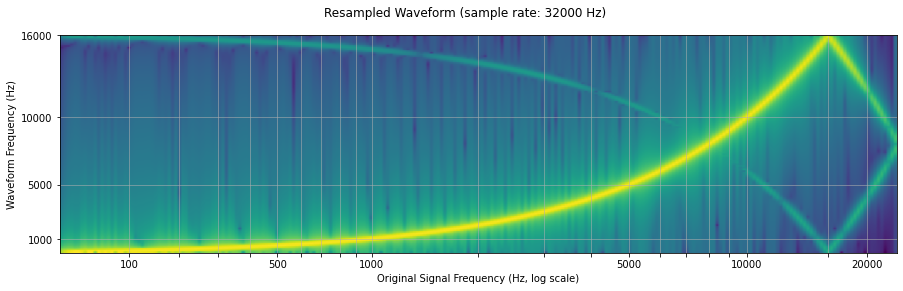

In [26]:
sample_rate = 48000
resample_rate = 32000

waveform = get_sine_sweep(sample_rate)
plot_sweep(waveform, sample_rate, title="Original Waveform")
play_audio(waveform, sample_rate)

resampler = T.Resample(sample_rate, resample_rate)
resampled_waveform = resampler(waveform)
plot_sweep(resampled_waveform, resample_rate, title="Resampled Waveform")
play_audio(waveform, sample_rate)

16000 16000


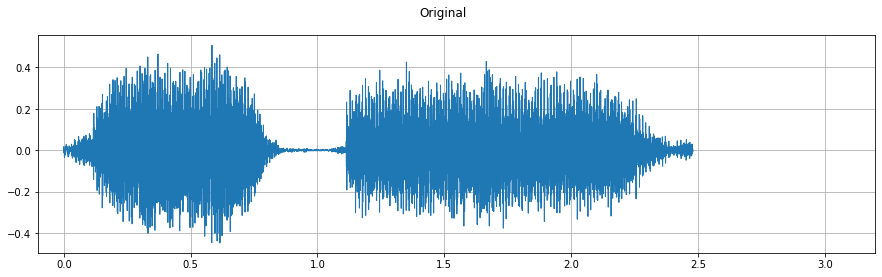

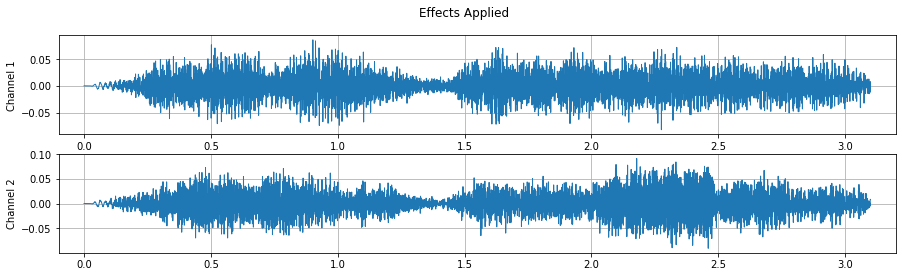

----------
Source: Original
----------
Sample Rate: 16000
Shape: (1, 39680)
Dtype: torch.float32
 - Max:      0.507
 - Min:     -0.448
 - Mean:    -0.000
 - Std Dev:  0.122

tensor([[ 0.0007,  0.0076,  0.0122,  ..., -0.0049, -0.0025,  0.0020]])

----------
Source: Effects Applied
----------
Sample Rate: 16000
Shape: (2, 49600)
Dtype: torch.float32
 - Max:      0.091
 - Min:     -0.091
 - Mean:    -0.000
 - Std Dev:  0.021

tensor([[0.0000, 0.0000, 0.0000,  ..., 0.0069, 0.0058, 0.0045],
        [0.0000, 0.0000, 0.0000,  ..., 0.0085, 0.0085, 0.0085]])



In [40]:
waveform1, sample_rate1 = get_sample(resample=16000)

# Define effects
effects = [
  ["lowpass", "-1", "300"], # apply single-pole lowpass filter
  ["speed", "0.8"],  # reduce the speed
                     # This only changes sample rate, so it is necessary to
                     # add `rate` effect with original sample rate after this.
  ["rate", f"{sample_rate1}"],
  ["reverb", "-w"],  # Reverbration gives some dramatic feeling
]

# Apply effects
waveform2, sample_rate2 = torchaudio.sox_effects.apply_effects_tensor(
    waveform1, sample_rate1, effects)

play_audio(waveform1, sample_rate1)
play_audio(waveform2, sample_rate2)
print(sample_rate1, sample_rate2)
plot_waveform(waveform1, sample_rate1, title="Original", xlim=(-.1, 3.2))
plot_waveform(waveform2, sample_rate2, title="Effects Applied", xlim=(-.1, 3.2))
print_stats(waveform1, sample_rate=sample_rate1, src="Original")
print_stats(waveform2, sample_rate=sample_rate2, src="Effects Applied")

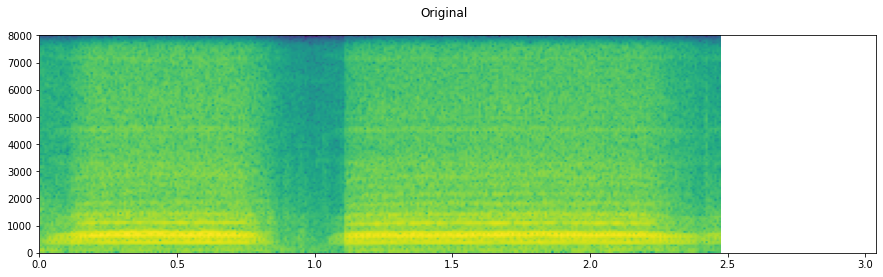

/opt/conda/lib/python3.8/site-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


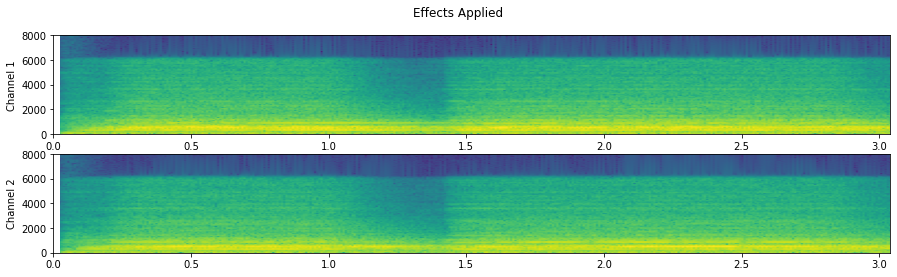

In [41]:
plot_specgram(waveform1, sample_rate1, title="Original", xlim=(0, 3.04))
play_audio(waveform1, sample_rate1)
plot_specgram(waveform2, sample_rate2, title="Effects Applied", xlim=(0, 3.04))
play_audio(waveform2, sample_rate2)

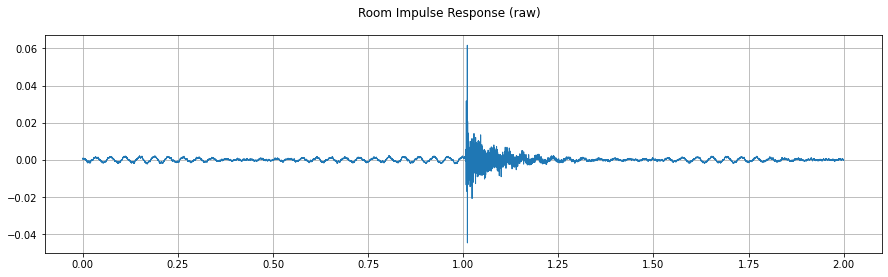

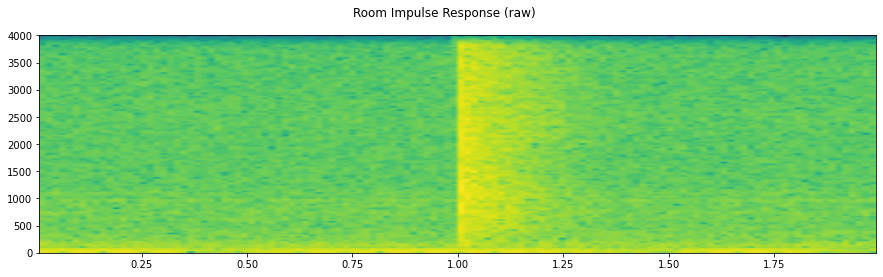

In [42]:
sample_rate = 8000

rir_raw, _ = get_rir_sample(resample=sample_rate)

plot_waveform(rir_raw, sample_rate, title="Room Impulse Response (raw)", ylim=None)
plot_specgram(rir_raw, sample_rate, title="Room Impulse Response (raw)")
play_audio(rir_raw, sample_rate)

Shape: (1, 2320)
Dtype: torch.float32
 - Max:      0.395
 - Min:     -0.286
 - Mean:    -0.000
 - Std Dev:  0.021

tensor([[-0.0052, -0.0076, -0.0071,  ...,  0.0184,  0.0173,  0.0070]])



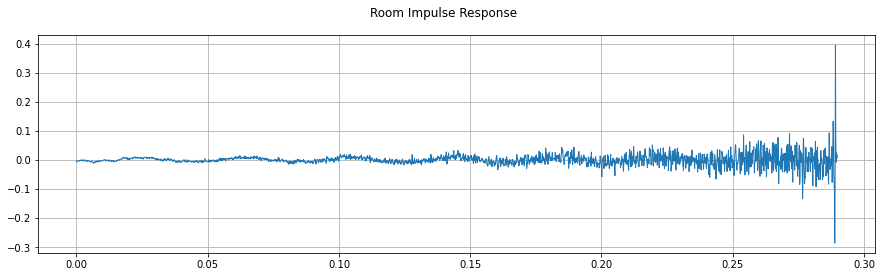

In [43]:
rir = rir_raw[:, int(sample_rate*1.01):int(sample_rate*1.3)]
rir = rir / torch.norm(rir, p=2)
rir = torch.flip(rir, [1])

print_stats(rir)
plot_waveform(rir, sample_rate, title="Room Impulse Response", ylim=None)

torch.Size([1, 27200])
torch.Size([1, 29519])
torch.Size([1, 2320])
torch.Size([1, 27200])


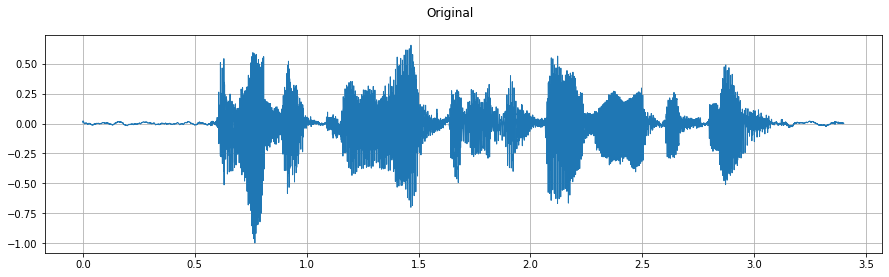

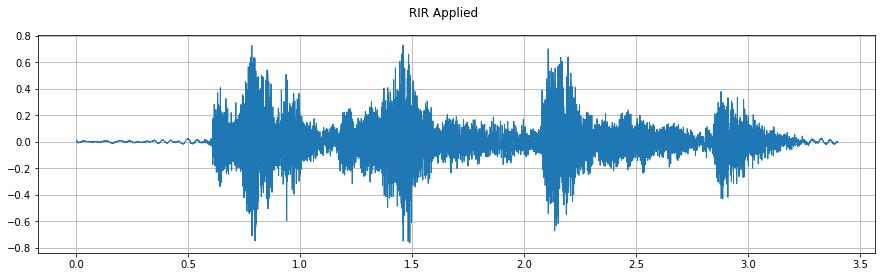

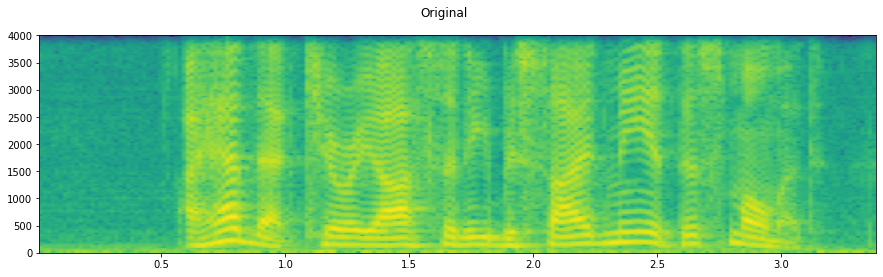

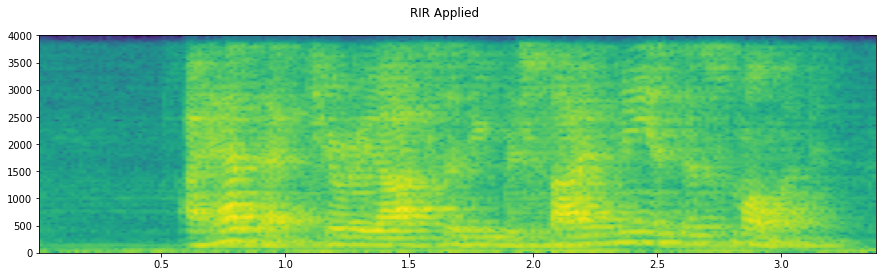

In [46]:
speech, _ = get_speech_sample(resample=sample_rate)
print(speech.shape)

speech_ = torch.nn.functional.pad(speech, (rir.shape[1]-1, 0))
print(speech_.shape)
augmented = torch.nn.functional.conv1d(speech_[None, ...], rir[None, ...])[0]
print(rir.shape)
print(augmented.shape)
plot_waveform(speech, sample_rate, title="Original", ylim=None)
plot_waveform(augmented, sample_rate, title="RIR Applied", ylim=None)

plot_specgram(speech, sample_rate, title="Original")
play_audio(speech, sample_rate)

plot_specgram(augmented, sample_rate, title="RIR Applied")
play_audio(augmented, sample_rate)

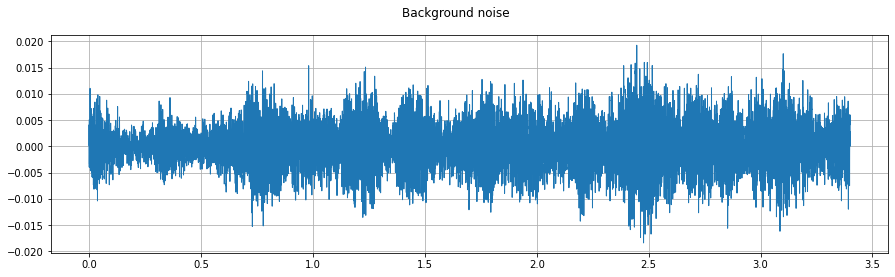

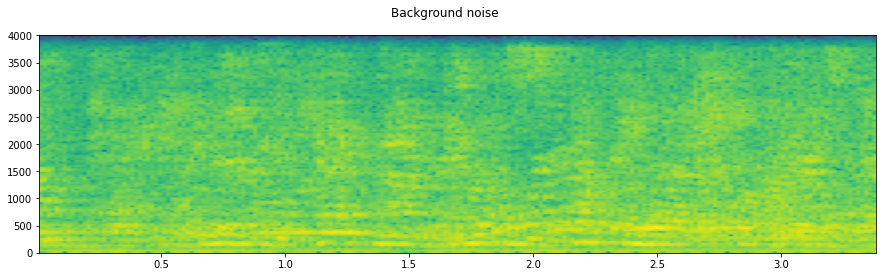

tensor(19.9257)
tensor(0.6665)
tensor(0.2472)


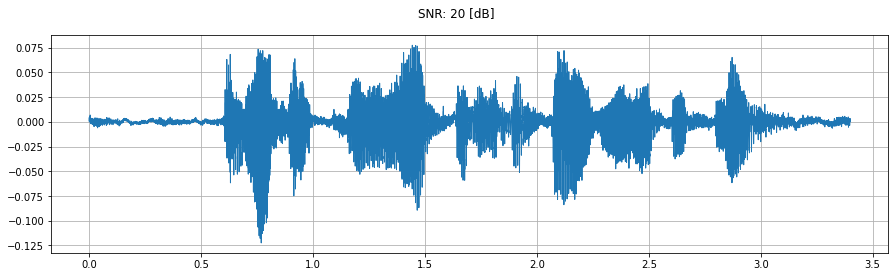

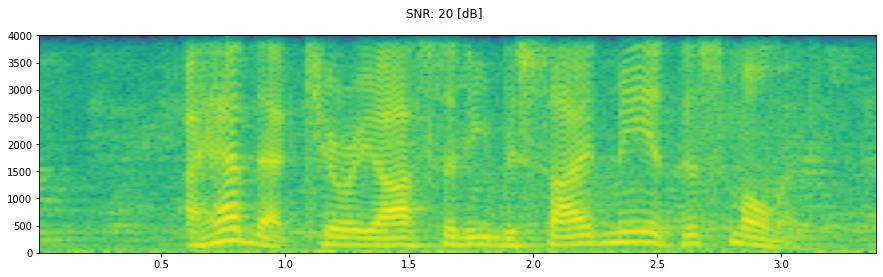

tensor(0.0909)


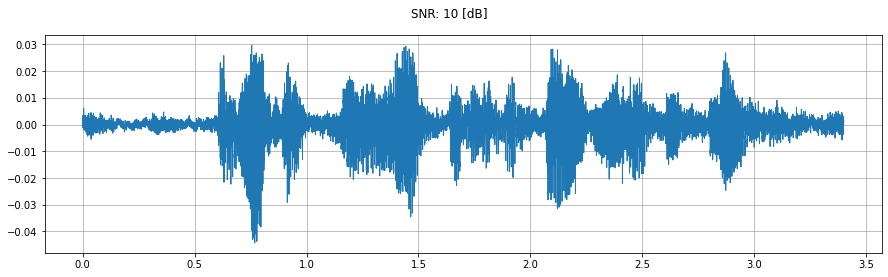

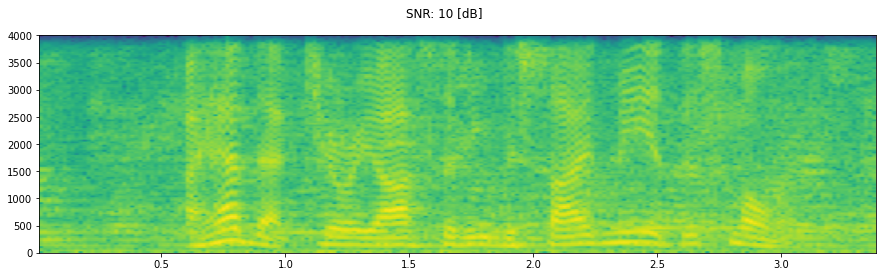

tensor(0.0452)


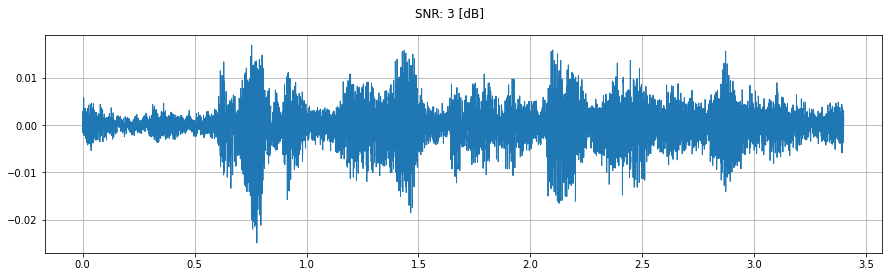

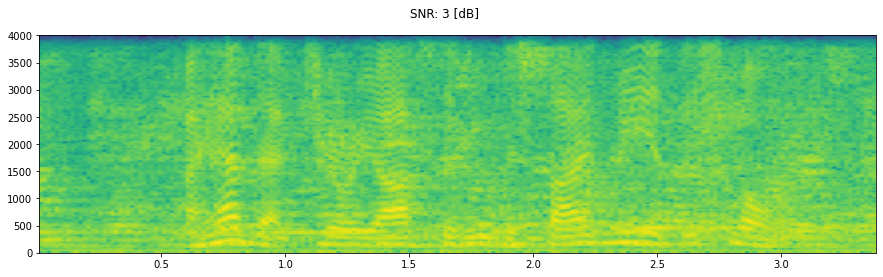

In [50]:
sample_rate = 8000
speech, _ = get_speech_sample(resample=sample_rate)
noise, _ = get_noise_sample(resample=sample_rate)
noise = noise[:, :speech.shape[1]]

plot_waveform(noise, sample_rate, title="Background noise")
plot_specgram(noise, sample_rate, title="Background noise")
play_audio(noise, sample_rate)

speech_power = speech.norm(p=2)
noise_power = noise.norm(p=2)

print(speech_power)
print(noise_power)

for snr_db in [20, 10, 3]:
    snr = math.exp(snr_db / 10)
    scale = snr * noise_power / speech_power
    print(scale)
    noisy_speech = (scale * speech + noise) / 2

    plot_waveform(noisy_speech, sample_rate, title=f"SNR: {snr_db} [dB]")
    plot_specgram(noisy_speech, sample_rate, title=f"SNR: {snr_db} [dB]")
    play_audio(noisy_speech, sample_rate)

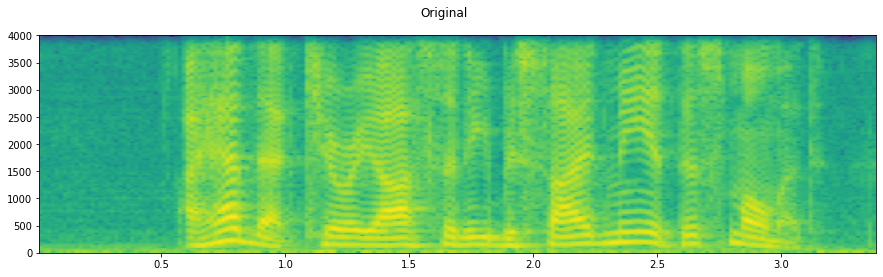

AttributeError: module 'torchaudio.functional' has no attribute 'apply_codec'

In [52]:
waveform, sample_rate = get_speech_sample(resample=8000)

plot_specgram(waveform, sample_rate, title="Original")
play_audio(waveform, sample_rate)

configs = [
    ({"format": "wav", "encoding": 'ULAW', "bits_per_sample": 8}, "8 bit mu-law"),
    ({"format": "gsm"}, "GSM-FR"),
    ({"format": "mp3", "compression": -9}, "MP3"),
    ({"format": "vorbis", "compression": -1}, "Vorbis"),
]
for param, title in configs:
    augmented = F.apply_codec(waveform, sample_rate, **param)
    plot_specgram(augmented, sample_rate, title=title)
    play_audio(augmented, sample_rate)

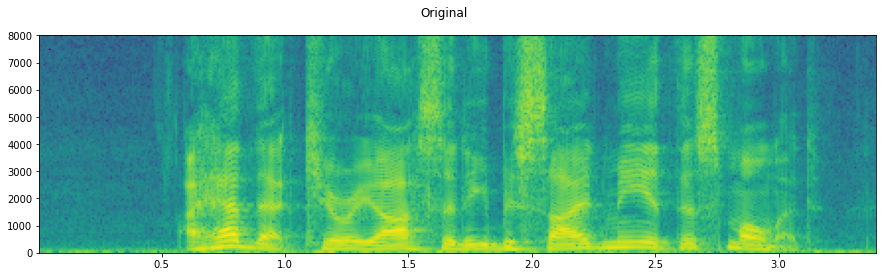

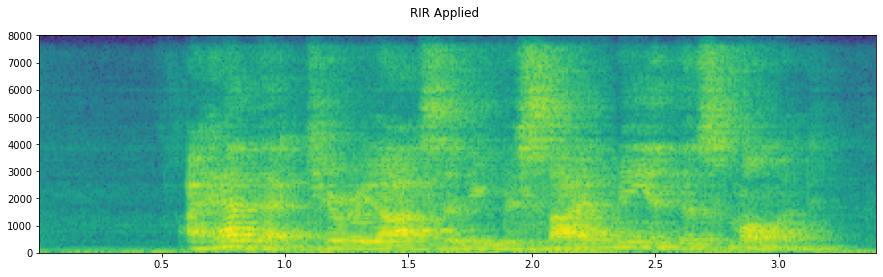

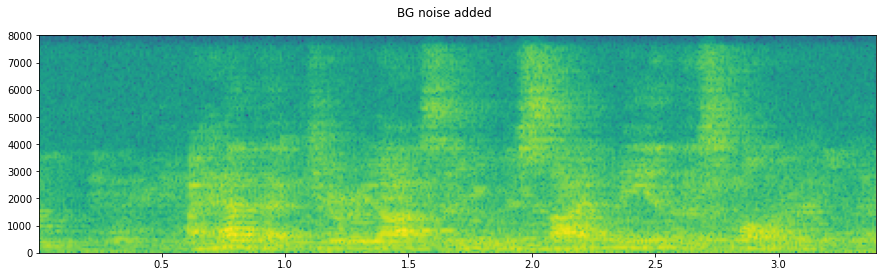

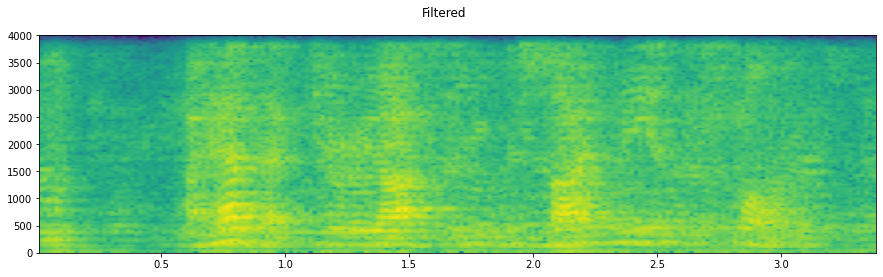

AttributeError: module 'torchaudio.functional' has no attribute 'apply_codec'

In [53]:
sample_rate = 16000
speech, _ = get_speech_sample(resample=sample_rate)

plot_specgram(speech, sample_rate, title="Original")
play_audio(speech, sample_rate)

# Apply RIR
rir, _ = get_rir_sample(resample=sample_rate, processed=True)
speech_ = torch.nn.functional.pad(speech, (rir.shape[1]-1, 0))
speech = torch.nn.functional.conv1d(speech_[None, ...], rir[None, ...])[0]

plot_specgram(speech, sample_rate, title="RIR Applied")
play_audio(speech, sample_rate)

# Add background noise
# Because the noise is recorded in the actual environment, we consider that
# the noise contains the acoustic feature of the environment. Therefore, we add
# the noise after RIR application.
noise, _ = get_noise_sample(resample=sample_rate)
noise = noise[:, :speech.shape[1]]

snr_db = 8
scale = math.exp(snr_db / 10) * noise.norm(p=2) / speech.norm(p=2)
speech = (scale * speech + noise) / 2

plot_specgram(speech, sample_rate, title="BG noise added")
play_audio(speech, sample_rate)

# Apply filtering and change sample rate
speech, sample_rate = torchaudio.sox_effects.apply_effects_tensor(
  speech,
  sample_rate,
  effects=[
      ["lowpass", "4000"],
      ["compand", "0.02,0.05", "-60,-60,-30,-10,-20,-8,-5,-8,-2,-8", "-8", "-7", "0.05"],
      ["rate", "8000"],
  ],
)

plot_specgram(speech, sample_rate, title="Filtered")
play_audio(speech, sample_rate)

# Apply telephony codec
speech = F.apply_codec(speech, sample_rate, format="gsm")

plot_specgram(speech, sample_rate, title="GSM Codec Applied")
play_audio(speech, sample_rate)

Shape: (1, 513, 107)
Dtype: torch.float32
 - Max:     4000.533
 - Min:      0.000
 - Mean:     5.726
 - Std Dev: 70.301

tensor([[[7.8743e+00, 4.4462e+00, 5.6781e-01,  ..., 2.7694e+01,
          8.9546e+00, 4.1289e+00],
         [7.1094e+00, 3.2595e+00, 7.3520e-01,  ..., 1.7141e+01,
          4.4812e+00, 8.0840e-01],
         [3.8374e+00, 8.2490e-01, 3.0779e-01,  ..., 1.8502e+00,
          1.1777e-01, 1.2369e-01],
         ...,
         [3.4701e-07, 1.0604e-05, 1.2395e-05,  ..., 7.4091e-06,
          8.2059e-07, 1.0176e-05],
         [4.7174e-05, 4.4331e-07, 3.9444e-05,  ..., 3.0622e-05,
          3.9737e-07, 8.1568e-06],
         [1.3221e-04, 1.6440e-05, 7.2536e-05,  ..., 5.4662e-05,
          1.1663e-05, 2.5758e-06]]])



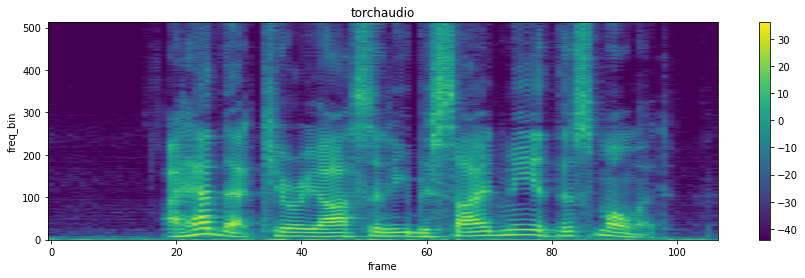

In [57]:
waveform, sample_rate = get_speech_sample()

n_fft = 1024
win_length = None
hop_length = 512

# define transformation
spectrogram = T.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
#     center=True,
#     pad_mode="reflect",
    power=2.0,
)
# Perform transformation
spec = spectrogram(waveform)

print_stats(spec)
plot_spectrogram(spec[0], title='torchaudio')


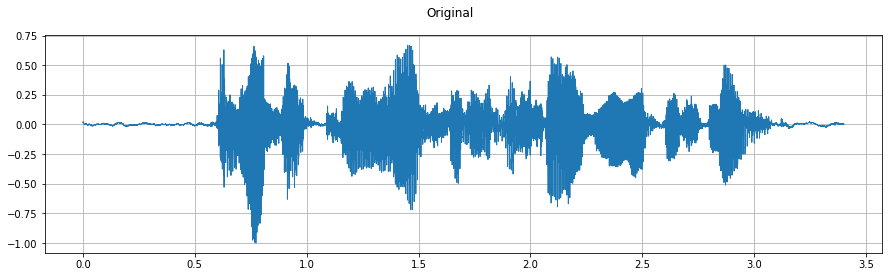

/opt/conda/lib/python3.8/site-packages/torch/functional.py:545: UserWarning: istft will require a complex-valued input tensor in a future PyTorch release. Matching the output from stft with return_complex=True.  (Triggered internally at  ../aten/src/ATen/native/SpectralOps.cpp:815.)
  return _VF.istft(input, n_fft, hop_length, win_length, window, center,  # type: ignore[attr-defined]


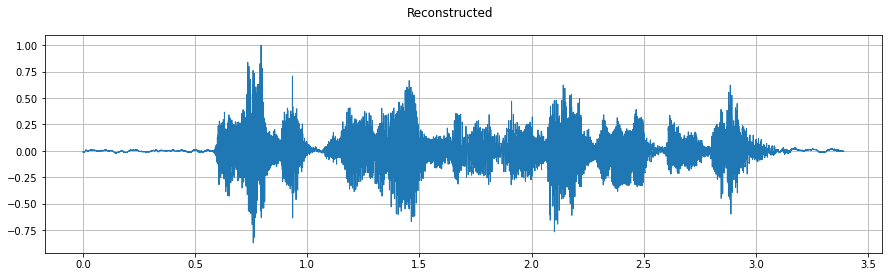

In [58]:
torch.random.manual_seed(0)
waveform, sample_rate = get_speech_sample()
plot_waveform(waveform, sample_rate, title="Original")
play_audio(waveform, sample_rate)

n_fft = 1024
win_length = None
hop_length = 512

spec = T.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
)(waveform)

griffin_lim = T.GriffinLim(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
)
waveform = griffin_lim(spec)

plot_waveform(waveform, sample_rate, title="Reconstructed")
play_audio(waveform, sample_rate)

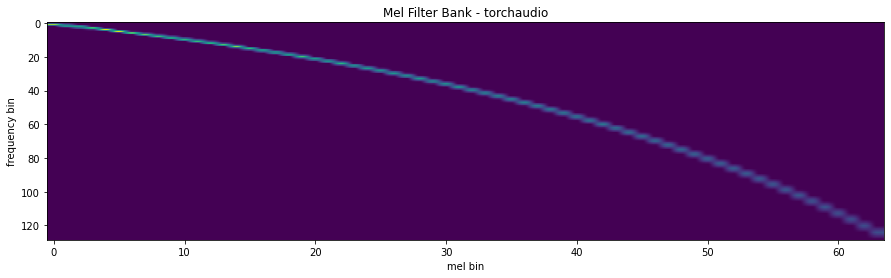

In [59]:
n_fft = 256
n_mels = 64
sample_rate = 6000

mel_filters = F.create_fb_matrix(
    int(n_fft // 2 + 1),
    n_mels=n_mels,
    f_min=0.,
    f_max=sample_rate/2.,
    sample_rate=sample_rate,
    norm='slaney'
)
plot_mel_fbank(mel_filters, "Mel Filter Bank - torchaudio")

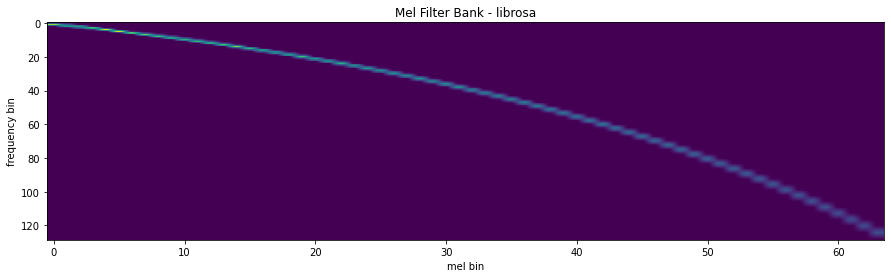

Mean Square Difference:  3.795462323290159e-17


In [60]:
mel_filters_librosa = librosa.filters.mel(
    sample_rate,
    n_fft,
    n_mels=n_mels,
    fmin=0.,
    fmax=sample_rate/2.,
    norm='slaney',
    htk=True,
).T

plot_mel_fbank(mel_filters_librosa, "Mel Filter Bank - librosa")

mse = torch.square(mel_filters - mel_filters_librosa).mean().item()
print('Mean Square Difference: ', mse)

torch.Size([1, 54400])
torch.Size([1, 128, 107])


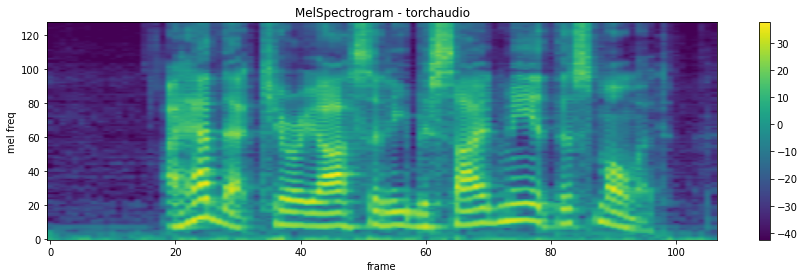

In [75]:
waveform, sample_rate = get_speech_sample()

n_fft = 1024
win_length = None
hop_length = 512
n_mels = 128

mel_spectrogram = T.MelSpectrogram(
    sample_rate=sample_rate,
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
#     center=True,
#     pad_mode="reflect",
    power=2.0,
#     norm='slaney',
#     onesided=True,
    n_mels=n_mels,
#     mel_scale="htk",
)

print(waveform.shape)
print(melspec.shape)
melspec = mel_spectrogram(waveform)
plot_spectrogram(
    melspec[0], title="MelSpectrogram - torchaudio", ylabel='mel freq')

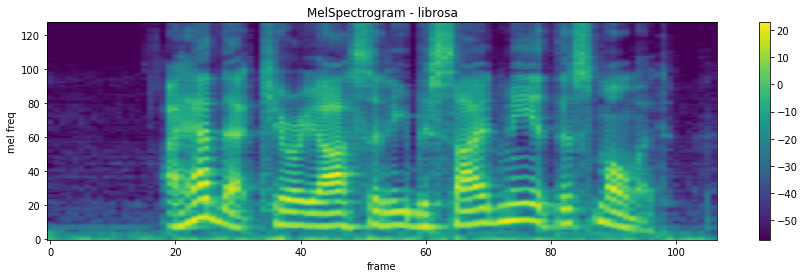

Mean Square Difference:  21368.85546875


In [76]:
melspec_librosa = librosa.feature.melspectrogram(
    waveform.numpy()[0],
    sr=sample_rate,
    n_fft=n_fft,
    hop_length=hop_length,
    win_length=win_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
    n_mels=n_mels,
    norm='slaney',
    htk=True,
)
plot_spectrogram(
    melspec_librosa, title="MelSpectrogram - librosa", ylabel='mel freq')

mse = torch.square(melspec - melspec_librosa).mean().item()
print('Mean Square Difference: ', mse)

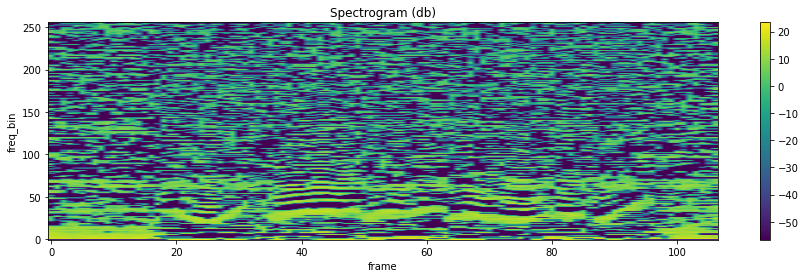

In [71]:
waveform, sample_rate = get_speech_sample()

n_fft = 2048
win_length = None
hop_length = 512
n_mels = 256
n_mfcc = 256

mfcc_transform = T.MFCC(
    sample_rate=sample_rate,
    n_mfcc=n_mfcc,
    melkwargs={
      'n_fft': n_fft,
      'n_mels': n_mels,
      'hop_length': hop_length,
#       'mel_scale': 'htk',
    }
)

mfcc = mfcc_transform(waveform)

plot_spectrogram(mfcc[0])

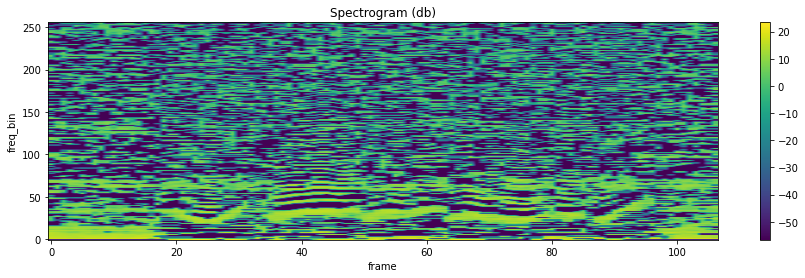

Mean Square Difference:  4.247390705813814e-08


In [72]:
melspec = librosa.feature.melspectrogram(
  y=waveform.numpy()[0], sr=sample_rate, n_fft=n_fft,
  win_length=win_length, hop_length=hop_length,
  n_mels=n_mels, htk=True, norm=None)

mfcc_librosa = librosa.feature.mfcc(
  S=librosa.core.spectrum.power_to_db(melspec),
  n_mfcc=n_mfcc, dct_type=2, norm='ortho')

plot_spectrogram(mfcc_librosa)

mse = torch.square(mfcc - mfcc_librosa).mean().item()
print('Mean Square Difference: ', mse)

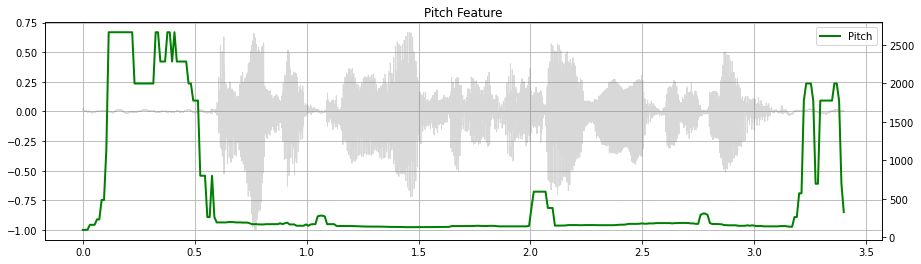

In [78]:
waveform, sample_rate = get_speech_sample()

pitch = F.detect_pitch_frequency(waveform, sample_rate)
plot_pitch(waveform, sample_rate, pitch)
play_audio(waveform, sample_rate)

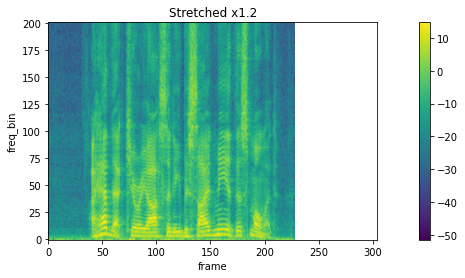

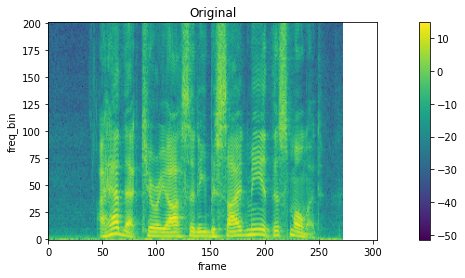

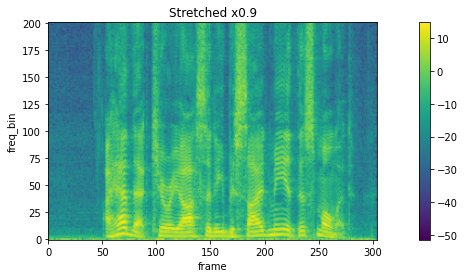

In [81]:
spec = get_spectrogram(power=None)
strech = T.TimeStretch()

rate = 1.2
spec_ = strech(spec, rate)
plot_spectrogram(F.complex_norm(spec_[0]), title=f"Stretched x{rate}", aspect='equal', xmax=304)

plot_spectrogram(F.complex_norm(spec[0]), title="Original", aspect='equal', xmax=304)

rate = 0.9
spec_ = strech(spec, rate)
plot_spectrogram(F.complex_norm(spec_[0]), title=f"Stretched x{rate}", aspect='equal', xmax=304)

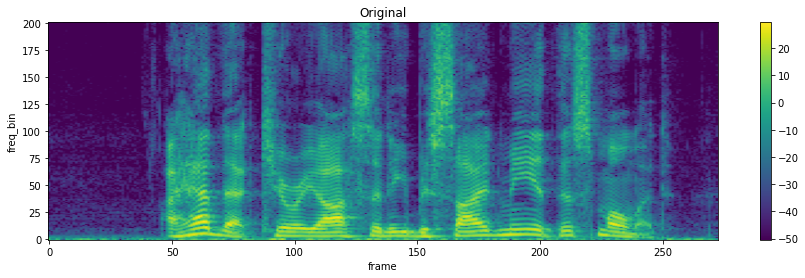

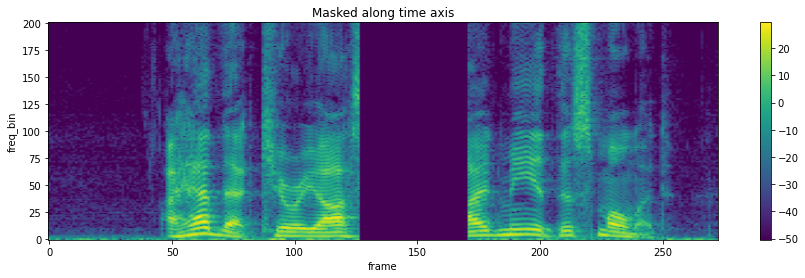

In [85]:
torch.random.manual_seed(4)

spec = get_spectrogram()
plot_spectrogram(spec[0], title="Original")

masking = T.TimeMasking(time_mask_param=80)
spec = masking(spec)

plot_spectrogram(spec[0], title="Masked along time axis")

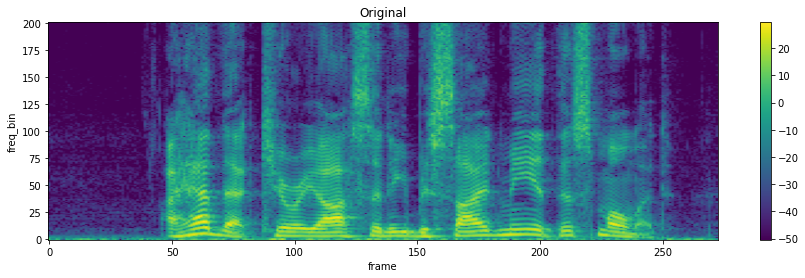

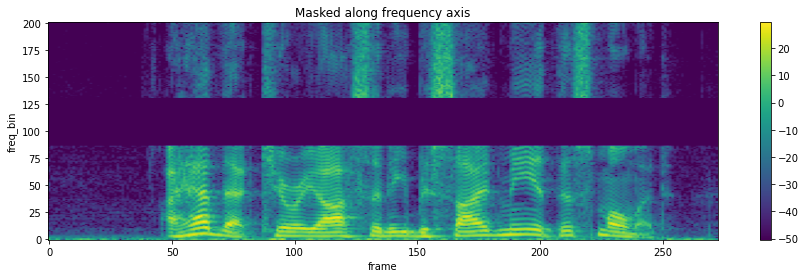

In [86]:
torch.random.manual_seed(4)

spec = get_spectrogram()
plot_spectrogram(spec[0], title="Original")

masking = T.FrequencyMasking(freq_mask_param=80)
spec = masking(spec)

plot_spectrogram(spec[0], title="Masked along frequency axis")

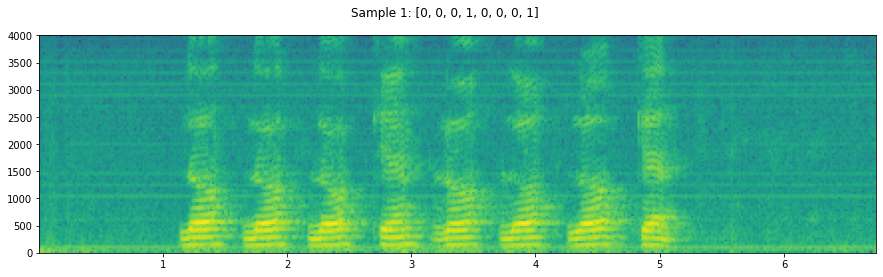

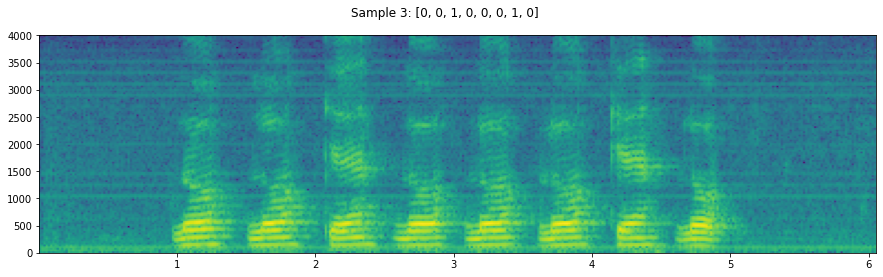

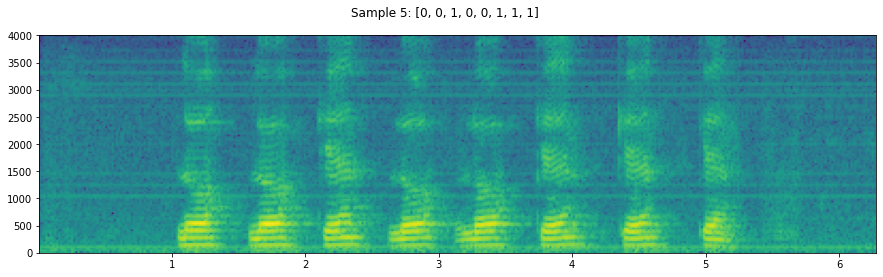

In [87]:
YESNO_DOWNLOAD_PROCESS.join()

dataset = torchaudio.datasets.YESNO(YESNO_DATASET_PATH, download=True)

for i in [1, 3, 5]:
    waveform, sample_rate, label = dataset[i]
    plot_specgram(waveform, sample_rate, title=f"Sample {i}: {label}")
    play_audio(waveform, sample_rate)